<a href="https://colab.research.google.com/github/TyronSamaroo/Visual_Analytics/blob/main/PCA_on_MTA_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MTA Turnstile PCA Assignment
## Ivan Miller - Rating 5/5
## Yinzi Xiang - Rating 5/5
## Tyron Samaroo - Rating 5/5
## Satesh Ramnath - Rating 5/5

In [ ]:
import numpy as np
import pandas as pd
from pandas import DataFrame, Series, read_csv
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

## EDA

In [ ]:
mta = pd.read_csv('https://raw.githubusercontent.com/mivan000/dse_i2700/main/mta.csv')

In [ ]:
mta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250874 entries, 0 to 250873
Data columns (total 26 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   From Date                                    250874 non-null  object 
 1   To Date                                      250874 non-null  object 
 2   Remote Station ID                            250874 non-null  object 
 3   Station                                      250874 non-null  object 
 4   Full Fare                                    250874 non-null  int64  
 5   Senior Citizen / Disabled                    250874 non-null  int64  
 6   7 Day ADA Farecard Access System Unlimited   250874 non-null  int64  
 7   30 Day ADA Farecard Access System Unlimited  250874 non-null  int64  
 8   Joint Rail Road Ticket                       250874 non-null  int64  
 9   7 Day Unlimited                              250874 non-nul

In [ ]:
mta.Station.nunique()

525

In [ ]:
#last report
mta.iloc[0]['From Date']

'08/06/2021'

In [ ]:
# first report
mta.iloc[-1]['From Date']

'05/29/2010'

In [ ]:
#checking for missing values
mta.isna().sum()

From Date                                          0
To Date                                            0
Remote Station ID                                  0
Station                                            0
Full Fare                                          0
Senior Citizen / Disabled                          0
7 Day ADA Farecard Access System Unlimited         0
30 Day ADA Farecard Access System Unlimited        0
Joint Rail Road Ticket                             0
7 Day Unlimited                                    0
30 Day Unlimited                                   0
14 Day Reduced Fare Media Unlimited            40798
1 Day Unlimited                                40798
14 Day Unlimited                               40798
7 Day Express Bus Pass                             0
Transit Check Metrocard                            0
LIB Special Senior                                 0
Rail Road Unlimited No Trade                       0
Transit Check Metrocard Annual Metrocard      

In [ ]:
# Dropping the columns having missing values
mta = mta.dropna(axis=1)
  
# Resetting the indices using df.reset_index()
mta = mta.reset_index(drop=True)

In [ ]:
mta.shape

(250874, 23)

In [ ]:
mta.head()

,From Date,To Date,Remote Station ID,Station,Full Fare,Senior Citizen / Disabled,7 Day ADA Farecard Access System Unlimited,30 Day ADA Farecard Access System Unlimited,Joint Rail Road Ticket,7 Day Unlimited,30 Day Unlimited,7 Day Express Bus Pass,Transit Check Metrocard,LIB Special Senior,Rail Road Unlimited No Trade,Transit Check Metrocard Annual Metrocard,Mail and Ride Easy Pay Express,Mail and Ride Unlimited,Path 2 Trip,Airtran Full Fare,Airtran 30 Day,Airtran 10 Trip,Airtran Monthly
0,08/06/2021,07/31/2021,R001,WHITEHALL STREET,27946,1824,242,376,8,11958,6355,19,552,539,162,0,717,0,0,0,327,0,0
1,08/06/2021,07/31/2021,R003,CYPRESS HILLS,1323,134,3,13,0,817,424,0,14,12,19,0,11,0,0,0,70,0,0
2,08/06/2021,07/31/2021,R004,75TH STREET & ELDERTS LANE,4241,321,15,43,0,2029,992,1,81,14,31,0,28,0,0,0,301,0,0
3,08/06/2021,07/31/2021,R005,85TH STREET & FOREST PKWAY,4418,389,29,30,1,1999,1108,0,44,13,25,0,40,0,0,0,111,0,0
4,08/06/2021,07/31/2021,R006,WOODHAVEN BOULEVARD,4193,315,27,55,0,2946,1518,1,64,36,14,0,25,0,0,0,148,0,0


In [ ]:
#checking the data types of numerical columns
mta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250874 entries, 0 to 250873
Data columns (total 23 columns):
 #   Column                                       Non-Null Count   Dtype 
---  ------                                       --------------   ----- 
 0   From Date                                    250874 non-null  object
 1   To Date                                      250874 non-null  object
 2   Remote Station ID                            250874 non-null  object
 3   Station                                      250874 non-null  object
 4   Full Fare                                    250874 non-null  int64 
 5   Senior Citizen / Disabled                    250874 non-null  int64 
 6   7 Day ADA Farecard Access System Unlimited   250874 non-null  int64 
 7   30 Day ADA Farecard Access System Unlimited  250874 non-null  int64 
 8   Joint Rail Road Ticket                       250874 non-null  int64 
 9   7 Day Unlimited                              250874 non-null  int64 
 

In [ ]:
numeric = ['int64']
#filtering out non-numerical columns
mta_num = mta.select_dtypes(include=numeric)
mta_num.shape

(250874, 19)

In [ ]:
#Scaling the data and saving it as a new dataframe
scaled_df = pd.DataFrame(scale(mta_num),columns = mta_num.columns) 

## PCA

In [ ]:
#running PCA without specifying number of components first
pca_all = PCA(n_components=3)
# Build the model using the scaled dataset as the input data
pca_all.fit(scaled_df)

PCA(n_components=3)

#### Compute and retrieve the scores values

In [ ]:
# Compute the scores that will essentially be representative of the data samples
scores = pca_all.transform(scaled_df)

In [ ]:
#Create a dataframe to make it more readable and assign column names as PC1, PC2 etc.
scores_df = pd.DataFrame(scores, columns = ['PC' +str(n) for n in range(1,scores.shape[1]+1)])
scores_df

,PC1,PC2,PC3
0,0.013623,0.007283,-0.196646
1,-2.307982,-0.069015,0.390348
2,-2.132742,0.052166,0.366766
3,-2.122759,-0.052800,0.339691
4,-2.083630,-0.035612,0.300108
...,...,...,...
250869,-2.199102,-0.081867,0.486173
250870,-1.635911,-0.029852,0.725044
250871,-1.204169,-0.002045,0.976720
250872,-1.839100,-0.039360,0.667807


### Retrieve the loadings values

In [ ]:
# Calculate loadings for the descriptors (19 in total)
loadings = pca_all.components_.T
df_loadings = pd.DataFrame(loadings, columns=['PC' +str(n) for n in range(1,loadings.shape[1]+1)])
df_loadings

,PC1,PC2,PC3
0,0.300436,0.012797,0.123198
1,0.304403,-0.012595,-0.101530
2,0.274913,-0.023297,-0.246657
3,0.258062,-0.022271,-0.241479
4,0.186188,0.010994,0.574148
5,0.284377,-0.018738,-0.188122
6,0.299674,-0.015838,-0.066863
7,0.189004,-0.001701,0.139662
8,0.290916,0.007815,0.129616
9,0.234914,-0.013295,-0.228034


### Explained variance for each PC

In [ ]:
# Calculate percent of the variance of the entire model contributed by each principal component
explained_variance = pca_all.explained_variance_ratio_
explained_variance

array([0.49213998, 0.19989209, 0.08850922])

In [ ]:
# Create labels for each component
labels = ['PC' +str(n) for n in range(1,len(explained_variance)+1)] 

# Insert empty label as the first label 
labels.insert(0,'')

# Insert 0 as the first value so that it will start from 0 when we calculate cumulative sum
explained_variance = np.insert(explained_variance, 0, 0) 

### Cumulative Variance

In [ ]:
# Calculate cumulative variance
cumulative_variance = np.cumsum(np.round(explained_variance, decimals=4))
cumulative_variance

array([0.    , 0.4921, 0.692 , 0.7805])

### Visualize the Variance each Principal Component Contributes to the model

In [ ]:
# Create a dataframe for PC labels
pc_df = pd.DataFrame(labels, columns=['Principal Components'])

# Create a dataframe for Explained Variance 
explained_variance_df = pd.DataFrame(explained_variance, columns=['Explained Variance'])

# Create a dataframe for Cumulative Variance 
cumulative_variance_df = pd.DataFrame(cumulative_variance, columns=['Cumulative Variance'])

In [ ]:
# Bring it all together into one dataframe for a scree plot 
df_scree = pd.concat([pc_df, explained_variance_df, cumulative_variance_df], axis=1)
df_scree.head()

,Principal Components,Explained Variance,Cumulative Variance
0,,0.000000,0.0000
1,PC1,0.492140,0.4921
2,PC2,0.199892,0.6920
3,PC3,0.088509,0.7805


### Create an Interactive Scree Plot For Explained Variance

In [ ]:
import plotly.express as px
fig = px.bar(df_scree, 
             x='Principal Components', y='Explained Variance',
             text='Explained Variance',
             width=800)

fig.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig.show()

### Create an Interactive Scree Plot for both Explained and Cumulative Variance

In [ ]:
import plotly.graph_objects as go

fig = go.Figure()


fig.add_trace(
    go.Scatter(
        x=df_scree['Principal Components'],
        y=df_scree['Cumulative Variance'],
        marker=dict(size=15, color="LightSeaGreen"),
        name="Cumulative Variance" 
    ))

fig.add_trace(
    go.Bar(
        x=df_scree['Principal Components'],
        y=df_scree['Explained Variance'],
        marker=dict(color="RoyalBlue"),
        name="Explained Variance" 
    ))

fig.update_layout(
    width=1000, height=600,
    title="Scree Plot ",
    xaxis_title="Principal Components",
    yaxis_title="Ratio of Explained Variance",
    font=dict(
 
        size=18
        
    )
)


fig.show()

We see that about 70% of the variance in the dataset is explained by principal components 1 and 2.
## Visualize the results of the PCA in 2D

Text(0, 0.5, 'Principal Component 2')

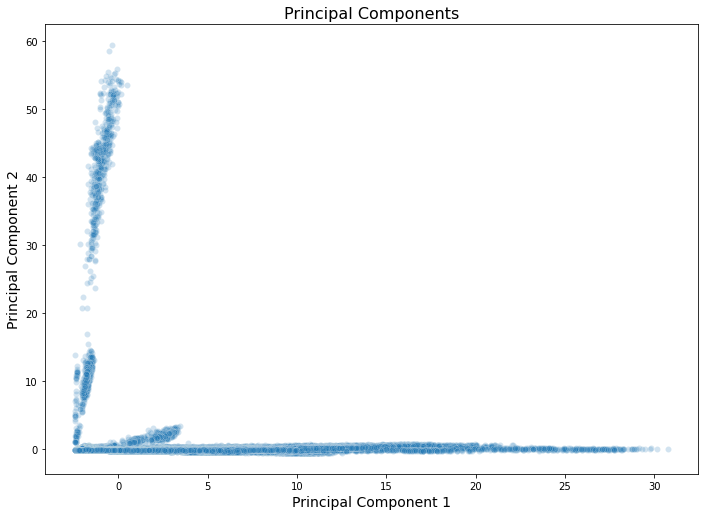

In [ ]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(x = scores[:,0], y = scores[:,1], alpha = 0.2).set_title("Principal Components", fontsize = 16)
ax.set_xlabel('Principal Component 1', fontsize = 14)
ax.set_ylabel('Principal Component 2', fontsize = 14)

## 3D Visualization of PCA performed on a subset of the dataset

In [ ]:
# Adding data on stations from to the scores dataframe for visualization 
scores_df['station'] = mta['Station']
scores_df['station_id'] = mta['Remote Station ID']

In [ ]:
fig = px.scatter_3d(scores_df, x='PC1', y='PC2', z='PC3', color = 'station')
fig.show()

Since the original dataset contains the data for more than 10 years (from 2010). Let's try looking at subset from the beginning of the 2020 and see if the visualization of the PCA will look nicer

### Creating a subset of the original dataset

In [ ]:
# Making a copy of the original dataframe
mta2 = mta.copy()

In [ ]:
mta2.head()

,From Date,To Date,Remote Station ID,Station,Full Fare,Senior Citizen / Disabled,7 Day ADA Farecard Access System Unlimited,30 Day ADA Farecard Access System Unlimited,Joint Rail Road Ticket,7 Day Unlimited,30 Day Unlimited,7 Day Express Bus Pass,Transit Check Metrocard,LIB Special Senior,Rail Road Unlimited No Trade,Transit Check Metrocard Annual Metrocard,Mail and Ride Easy Pay Express,Mail and Ride Unlimited,Path 2 Trip,Airtran Full Fare,Airtran 30 Day,Airtran 10 Trip,Airtran Monthly
0,08/06/2021,07/31/2021,R001,WHITEHALL STREET,27946,1824,242,376,8,11958,6355,19,552,539,162,0,717,0,0,0,327,0,0
1,08/06/2021,07/31/2021,R003,CYPRESS HILLS,1323,134,3,13,0,817,424,0,14,12,19,0,11,0,0,0,70,0,0
2,08/06/2021,07/31/2021,R004,75TH STREET & ELDERTS LANE,4241,321,15,43,0,2029,992,1,81,14,31,0,28,0,0,0,301,0,0
3,08/06/2021,07/31/2021,R005,85TH STREET & FOREST PKWAY,4418,389,29,30,1,1999,1108,0,44,13,25,0,40,0,0,0,111,0,0
4,08/06/2021,07/31/2021,R006,WOODHAVEN BOULEVARD,4193,315,27,55,0,2946,1518,1,64,36,14,0,25,0,0,0,148,0,0


In [ ]:
# Transforming dates into datetime objects
mta2['from_date'] = pd.to_datetime(mta['From Date'])
mta2['to_date'] = pd.to_datetime(mta['To Date'])

In [ ]:
# Checking the result
# mta2.info()

In [ ]:
# Dropping the original columns
mta2.drop(['From Date', 'To Date'], axis = 1, inplace = True)

In [ ]:
# Checking the result
# mta2.info()

In [ ]:
# Filtering the data prior to the begging of 2020 out
mta2 = mta2[mta2['from_date'] >= '2020-01-01']
# Checking missing values
mta2.isna().sum()

Remote Station ID                              0
Station                                        0
Full Fare                                      0
Senior Citizen / Disabled                      0
7 Day ADA Farecard Access System Unlimited     0
30 Day ADA Farecard Access System Unlimited    0
Joint Rail Road Ticket                         0
7 Day Unlimited                                0
30 Day Unlimited                               0
7 Day Express Bus Pass                         0
Transit Check Metrocard                        0
LIB Special Senior                             0
Rail Road Unlimited No Trade                   0
Transit Check Metrocard Annual Metrocard       0
Mail and Ride Easy Pay Express                 0
Mail and Ride Unlimited                        0
Path 2 Trip                                    0
Airtran Full Fare                              0
Airtran 30 Day                                 0
Airtran 10 Trip                                0
Airtran Monthly     

In [ ]:
# Dropping the columns with predominantly missing values (unless dropped before)
# mta2.drop(['14 Day Reduced Fare Media Unlimited','1 Day Unlimited','14 Day Unlimited'], axis =1, inplace = True)

In [ ]:
# mta2.isna().sum()

In [ ]:
# numeric = ['int64']
#filtering out non-numerical columns
mta_num2 = mta2.select_dtypes(include=numeric)
# mta_num2.shape

In [ ]:
#Scaling the dataset
scaled_df2 = pd.DataFrame(scale(mta_num2),columns = mta_num.columns) 

In [ ]:
# scaled_df2.head()

## PCA on a smaller dataset

In [ ]:
pca2 = PCA(n_components=3)
# Build the model using the scaled dataset as the input data
pca2.fit(scaled_df2)

# Compute the scores that will essentially be representative of the data samples
scores2 = pca2.transform(scaled_df2)

In [ ]:
# scaled_df2['station'] = mta['Station']
# scaled_df2['station_id'] = mta['Remote Station ID']
# scaled_df2.head()

In [ ]:
#Create a dataframe to make it more readable and assign column names as PC1, PC2 etc.
scores_df2 = pd.DataFrame(scores2, columns = ['PC' +str(n) for n in range(1,scores.shape[1]+1)])
# scores_df

# Calculate loadings for the descriptors (19 in total)
loadings2 = pca2.components_.T
df_loadings2 = pd.DataFrame(loadings2, columns=['PC' +str(n) for n in range(1,loadings.shape[1]+1)])
# df_loadings

# Calculate percent of the variance of the entire model contributed by each principal component
explained_variance2 = pca2.explained_variance_ratio_
# explained_variance

# Create labels for each component
labels2 = ['PC' +str(n) for n in range(1,len(explained_variance2)+1)] 

# Insert empty label as the first label 
labels2.insert(0,'')

# Insert 0 as the first value so that it will start from 0 when we calculate cumulative sum
explained_variance2 = np.insert(explained_variance2, 0, 0)

# Calculate cumulative variance
cumulative_variance2 = np.cumsum(np.round(explained_variance2, decimals=4))
# cumulative_variance

# Create a dataframe for PC labels
pc_df2 = pd.DataFrame(labels2, columns=['Principal Components'])

# Create a dataframe for Explained Variance 
explained_variance_df2 = pd.DataFrame(explained_variance2, columns=['Explained Variance'])

# Create a dataframe for Cumulative Variance 
cumulative_variance_df2 = pd.DataFrame(cumulative_variance2, columns=['Cumulative Variance'])

# Bring it all together into one dataframe for a scree plot 
df_scree = pd.concat([pc_df2, explained_variance_df2, cumulative_variance_df2], axis=1)
df_scree.head()

,Principal Components,Explained Variance,Cumulative Variance
0,,0.000000,0.0000
1,PC1,0.514117,0.5141
2,PC2,0.196563,0.7107
3,PC3,0.079753,0.7905


In [ ]:
# Adding data on stations from to the scores dataframe for visualization 
scores_df2['station'] = mta2['Station']
scores_df2['station_id'] = mta2['Remote Station ID']
scores_df2.head()

,PC1,PC2,PC3,station,station_id
0,2.432272,-0.017956,-0.444147,WHITEHALL STREET,R001
1,-1.546718,0.006056,0.300878,CYPRESS HILLS,R003
2,-1.224627,0.171466,0.250561,75TH STREET & ELDERTS LANE,R004
3,-1.231506,0.019492,0.209443,85TH STREET & FOREST PKWAY,R005
4,-1.160958,0.041668,0.109370,WOODHAVEN BOULEVARD,R006


## Visualize the results of the PCA in 2D

Text(0, 0.5, 'Principal Component 2')

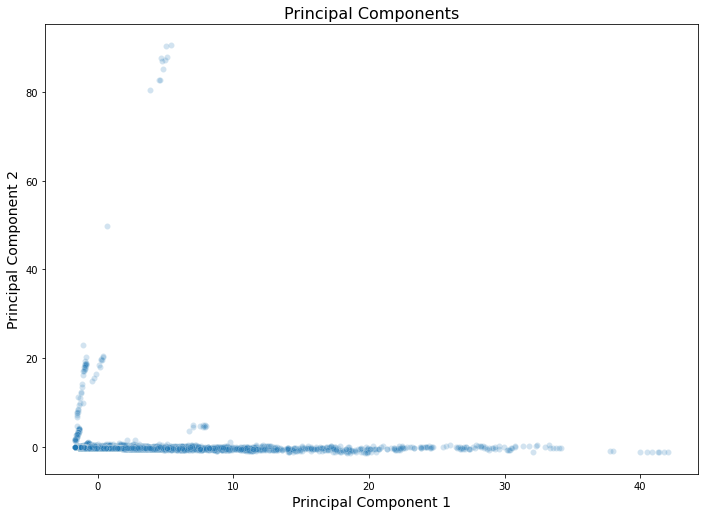

In [ ]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(data = scores_df2, x = 'PC1', y = 'PC2', alpha = 0.2).set_title("Principal Components", fontsize = 16)
ax.set_xlabel('Principal Component 1', fontsize = 14)
ax.set_ylabel('Principal Component 2', fontsize = 14)

## 3D Visualization of PCA performed on a subset of the dataset

In [ ]:
fig = px.scatter_3d(scores_df2, x='PC1', y='PC2', z='PC3', color = 'station')
fig.show()

## Looking at just one week of data

In [ ]:
one_report = mta2[mta2['to_date'] == '2021-07-31']
print(one_report.to_date.max(),one_report.to_date.min())

In [ ]:
#filtering out non-numerical columns
one_report_num = one_report.select_dtypes(include=numeric)

#Scaling the dataset
one_report_scaled = pd.DataFrame(scale(one_report_num),columns = one_report_num.columns) 

In [ ]:
pca_one_rep = PCA(n_components=3)
# Build the model using the scaled dataset as the input data
pca_one_rep.fit(one_report_scaled)

# Compute the scores that will essentially be representative of the data samples
scores_one_rep = pca2.transform(one_report_scaled)
#Create a dataframe to make it more readable and assign column names as PC1, PC2 etc.
scores_df_one_rep = pd.DataFrame(scores_one_rep, columns = ['PC' +str(n) for n in range(1,scores_one_rep.shape[1]+1)])
# scores_df

In [ ]:
scores_df_one_rep['station'] = one_report['Station']
scores_df_one_rep['station_id'] = one_report['Remote Station ID']

In [ ]:
fig = px.scatter_3d(scores_df_one_rep, x='PC1', y='PC2', z='PC3', color = 'station')
fig.show()

Yearly PCA Analysis

In [ ]:
mta_yearly = mta.copy()

# Transforming dates into datetime objects
mta_yearly['from_date'] = pd.to_datetime(mta['From Date'])
mta_yearly['to_date'] = pd.to_datetime(mta['To Date'])

# Dropping the original columns
mta_yearly.drop(['From Date', 'To Date'], axis = 1, inplace = True)

In [ ]:
mta_yearly['year'] = mta_yearly['to_date'].dt.year

In [ ]:
mta_yearly_2019 = mta_yearly[mta_yearly['year'] == 2019]
mta_yearly_2020 = mta_yearly[mta_yearly['year'] == 2020]
mta_yearly_2021 = mta_yearly[mta_yearly['year'] == 2021]

In [ ]:
mta_yearly_2019.shape

In [ ]:
mta_yearly_2020.shape

In [ ]:
mta_yearly_2021.shape

In [ ]:
mta_yearly.info()

In [ ]:
mta_yearly_2019 = mta_yearly_2019.select_dtypes(include=numeric)
mta_yearly_2020 = mta_yearly_2020.select_dtypes(include=numeric)
mta_yearly_2021 = mta_yearly_2021.select_dtypes(include=numeric)

In [ ]:
mta_scaled_2019 = pd.DataFrame(scale(mta_yearly_2019),columns = mta_yearly_2019.columns) 
mta_scaled_2020 = pd.DataFrame(scale(mta_yearly_2020),columns = mta_yearly_2020.columns)
mta_scaled_2021 = pd.DataFrame(scale(mta_yearly_2021),columns = mta_yearly_2021.columns)

In [ ]:
def PCA_yearly(df, df_origin):
  pca_yearly = PCA(n_components=3)
  # Build the model using the scaled dataset as the input data
  

  # Compute the scores that will essentially be representative of the data samples
  scores_yearly = pca_yearly.fit_transform(df)
  #Create a dataframe to make it more readable and assign column names as PC1, PC2 etc.
  scores_yearly = pd.DataFrame(scores_yearly, columns = ['PC' +str(n) for n in range(1,scores_one_rep.shape[1]+1)])

  scores_yearly['station'] = df_origin['Station']
  scores_yearly['station_id'] = df_origin['Remote Station ID']

  fig = px.scatter_3d(scores_yearly, x='PC1', y='PC2', z='PC3', color = 'station')
  fig.show()

#Comparison of 2019, 2020, and 2021

In [ ]:
# Generating 3D plot of first 3 Prinipal Components for 2019 MTA data using PCA_yearly function defined above
PCA_yearly(mta_scaled_2019, mta_yearly)

In [ ]:
# Generating 3D plot of first 3 Prinipal Components for 2020 MTA data using PCA_yearly function defined above passing in scaled data
PCA_yearly(mta_scaled_2020, mta_yearly)

In [ ]:
# Generating 3D plot of first 3 Prinipal Components for 2021 MTA data using PCA_yearly function defined above passing in scaled data
PCA_yearly(mta_scaled_2021, mta_yearly)

Key Observations:
*   The years 2019 and 2020 shared a similar trend in comparison of the first 3 Principal Components. 
*   The year 2021 significantly differs in PCA trends particularly in the plane of PC3. There is much more density in 2019 and 2020, however 2021 exibits less.



# Scatter Plot Matrix of PCA based on Weekly Sample of Data

In [ ]:
pairplot_sample = pca2.transform(one_report_scaled)
pca_sample_pairplot = pd.DataFrame(pairplot_sample, columns = ['PC' +str(n) for n in range(1,scores_one_rep.shape[1]+1)])
sns.pairplot(pca_sample_pairplot)

# Correlation Matricies Heatmaps

## Weekly Sample Heatmap of Top 3 Principal Components

In [ ]:
sns.heatmap(pca_sample_pairplot.corr(), annot=True)

In [ ]:
def PCA_yearly_corr(df, df_origin):
  pca_yearly = PCA(n_components=3)
  # Build the model using the scaled dataset as the input data
  

  # Compute the scores that will essentially be representative of the data samples
  scores_yearly = pca_yearly.fit_transform(df)
  #Create a dataframe to make it more readable and assign column names as PC1, PC2 etc.
  scores_yearly = pd.DataFrame(scores_yearly, columns = ['PC' +str(n) for n in range(1,scores_one_rep.shape[1]+1)])

  scores_yearly_corr_m = scores_yearly.corr()
  sns.heatmap(scores_yearly_corr_m, annot=True)

## 2019 Heatmap of Top 3 Principal Components

In [ ]:
PCA_yearly_corr(mta_scaled_2019, mta_yearly)

## 2020 Heatmap of Top 3 Principal Components

In [ ]:
PCA_yearly_corr(mta_scaled_2020, mta_yearly)

## 2021 Heatmap of Top 3 Principal Components

In [ ]:
PCA_yearly_corr(mta_scaled_2021, mta_yearly)

# Heatmap of all MTA Attributes

## Heatmap of all MTA Attributes of Year 2019

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(mta_scaled_2019.corr(), annot=True)

## Heatmap of all MTA Attributes of Year 2020

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(mta_scaled_2020.corr(), annot=True)

## Heatmap of all MTA Attributes of Year 2021

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(mta_scaled_2021.corr(), annot=True)